In [ ]:
# Install packages

#!pip install sentinelsat
#!pip install shapely
#!pip install pandas
#!pip install rasterio
#!pip install matplotlib

  Using cached pandas-2.2.3-cp313-cp313-macosx_11_0_arm64.whl.metadata (89 kB)
  Using cached pytz-2025.2-py2.py3-none-any.whl.metadata (22 kB)
  Using cached tzdata-2025.2-py2.py3-none-any.whl.metadata (1.4 kB)
Using cached pandas-2.2.3-cp313-cp313-macosx_11_0_arm64.whl (11.3 MB)
Using cached pytz-2025.2-py2.py3-none-any.whl (509 kB)
Using cached tzdata-2025.2-py2.py3-none-any.whl (347 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [pandas]2m2/3 [pandas]


In [1]:
# Import packages

from datetime import datetime, timedelta
from shapely.geometry import Polygon, Point
import numpy as np
import requests
import pandas as pd
from shapely.geometry import Polygon
from xml.etree import ElementTree as ET
from shapely.geometry import Polygon
import os
from IPython.display import display
import json
import os
import zipfile
import xml.etree.ElementTree as ET
from urllib.parse import quote
import zipfile
import xml.etree.ElementTree as ET
import os
import zipfile
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import glob

In [2]:
# Define credentials

username = 'ucabtc8@ucl.ac.uk'
password = 'Grandcanyon48!'

In [3]:
# Provided functions

def make_api_request(url, method="GET", data=None, headers=None):
    global access_token
    if not headers:
        headers = {"Authorization": f"Bearer {access_token}"}

    response = requests.request(method, url, json=data, headers=headers)
    if response.status_code in [401, 403]:
        global refresh_token
        access_token = refresh_access_token(refresh_token)
        headers["Authorization"] = f"Bearer {access_token}"
        response = requests.request(method, url, json=data, headers=headers)
    return response


def get_access_and_refresh_token(username, password):
    """Retrieve both access and refresh tokens."""
    url = "https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token"
    data = {
        "grant_type": "password",
        "username": username,
        "password": password,
        "client_id": "cdse-public",
    }
    response = requests.post(url, data=data)
    response.raise_for_status()
    tokens = response.json()
    return tokens["access_token"], tokens["refresh_token"]


def refresh_access_token(refresh_token):
    """Attempt to refresh the access token using the refresh token."""
    url = "https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token"
    data = {
        "grant_type": "refresh_token",
        "refresh_token": refresh_token,
        "client_id": "cdse-public",
    }
    headers = {"Content-Type": "application/x-www-form-urlencoded"}
    try:
        response = requests.post(url, headers=headers, data=data)
        response.raise_for_status()  # This will throw an error for non-2xx responses
        return response.json()["access_token"]
    except requests.exceptions.HTTPError as e:
        print(f"Failed to refresh token: {e.response.status_code} - {e.response.text}")
        if e.response.status_code == 400:
            print("Refresh token invalid, attempting re-authentication...")
            # Attempt to re-authenticate
            username = username
            password = password
            # This requires securely managing the credentials, which might not be feasible in all contexts
            access_token, new_refresh_token = get_access_and_refresh_token(
                username, password
            )  # This is a placeholder
            refresh_token = (
                new_refresh_token  # Update the global refresh token with the new one
            )
            return access_token
        else:
            raise

def download_single_product(
    product_id, file_name, access_token, download_dir="downloaded_products"
):
    """
    Download a single product from the Copernicus Data Space.

    :param product_id: The unique identifier for the product.
    :param file_name: The name of the file to be downloaded.
    :param access_token: The access token for authorization.
    :param download_dir: The directory where the product will be saved.
    """
    # Ensure the download directory exists
    os.makedirs(download_dir, exist_ok=True)

    # Construct the download URL
    url = (
        f"https://zipper.dataspace.copernicus.eu/odata/v1/Products({product_id})/$value"
    )

    # Set up the session and headers
    headers = {"Authorization": f"Bearer {access_token}"}
    session = requests.Session()
    session.headers.update(headers)

    # Perform the request
    response = session.get(url, headers=headers, stream=True)

    # Check if the request was successful
    if response.status_code == 200:
        # Define the path for the output file
        output_file_path = os.path.join(download_dir, file_name + ".zip")

        # Stream the content to a file
        with open(output_file_path, "wb") as file:
            for chunk in response.iter_content(chunk_size=8192):
                if chunk:
                    file.write(chunk)
        print(f"Downloaded: {output_file_path}")
    else:
        print(
            f"Failed to download product {product_id}. Status Code: {response.status_code}"
        )

In [4]:
def query_sentinel2_arctic_data(
    start_date,
    end_date,
    token,
    min_cloud_percentage,
    max_cloud_percentage,
):
    """
    Queries Sentinel-2 data within a specified time range from the Copernicus Data Space,
    considering a range of cloud coverage by treating greater than and less than conditions as separate attributes.
    Handles pagination to fetch all available data.

    Parameters:
    start_date (str): Start date in 'YYYY-MM-DD' format.
    end_date (str): End date in 'YYYY-MM-DD' format.
    token (str): Access token for authentication.
    min_cloud_percentage (int): Minimum allowed cloud coverage.
    max_cloud_percentage (int): Maximum allowed cloud coverage.

    Returns:
    DataFrame: Contains details about the Sentinel-2 images.
    """

    all_data = []
    #arctic_polygon = "POLYGON((-180 60, 180 60, 180 90, -180 90, -180 60))"
    north_slope_polygon = "POLYGON((-162.0 68.5, -162.0 71.5, -140.0 71.5, -140.0 68.5, -162.0 68.5))"

    filter_string = (
        f"Collection/Name eq 'SENTINEL-2' and "
        f"Attributes/OData.CSC.StringAttribute/"
        f"any(att:att/Name eq 'productType' and att/Value eq 'S2MSI2A') and "
        f"Attributes/OData.CSC.DoubleAttribute/any(att:att/Name eq 'cloudCover' and att/Value ge {min_cloud_percentage}) and "
        f"Attributes/OData.CSC.DoubleAttribute/any(att:att/Name eq 'cloudCover' and att/Value le {max_cloud_percentage}) and "
        f"ContentDate/Start gt {start_date}T00:00:00.000Z and ContentDate/Start lt {end_date}T23:59:59.999Z"
    )

    next_url = (
        f"https://catalogue.dataspace.copernicus.eu/odata/v1/Products?"
        f"$filter={filter_string} and "
        f"OData.CSC.Intersects(area=geography'SRID=4326;{north_slope_polygon}')&"
        f"$top=1000"
    )

    headers = {"Authorization": f"Bearer {token}"}

    while next_url:
        response = make_api_request(
            next_url, headers={"Authorization": f"Bearer {token}"}
        )
        if response.status_code == 200:
            data = response.json()["value"]
            all_data.extend(data)
            next_url = response.json().get("@odata.nextLink")
        else:
            print(f"Error fetching data: {response.status_code} - {response.text}")
            break

    return pd.DataFrame(all_data)

In [29]:
# Custom functions

def extract_attributes(df):
    cloud_covers = []
    footprints = []
    for _, row in df.iterrows():
        cloud_cover = None
        attrs = row.get("Attributes", [])
        for attr in attrs:
            if attr.get("Name") == "cloudCover":
                cloud_cover = float(attr.get("Value"))
        cloud_covers.append(cloud_cover)
        footprints.append(row.get("Footprint"))
    df["CloudCover"] = cloud_covers
    df["FootprintWKT"] = footprints
    df["StartDate"] = pd.to_datetime(df["ContentDate"].apply(lambda x: x.get("Start")))
    return df

def find_closest_cloudy_match(cloudless_df, cloudy_df, max_days=30):
    matched_rows = []
    for _, clear_row in cloudless_df.iterrows():
        clear_date = clear_row["StartDate"]
        clear_fp = clear_row["FootprintWKT"]

        candidates = cloudy_df[
            (cloudy_df["FootprintWKT"] == clear_fp) &
            (cloudy_df["StartDate"] >= clear_date - pd.Timedelta(days=max_days)) &
            (cloudy_df["StartDate"] <= clear_date + pd.Timedelta(days=max_days))
        ]

        if not candidates.empty:
            closest = candidates.iloc[(candidates["StartDate"] - clear_date).abs().argsort()[:1]]
            for _, cloudy_row in closest.iterrows():
                matched_rows.append({
                    "Clear_Id": clear_row["Id"],
                    "Clear_Name": clear_row["Name"],
                    "Clear_Date": clear_date,
                    "Cloudy_Id": cloudy_row["Id"],
                    "Cloudy_Name": cloudy_row["Name"],
                    "Cloudy_Date": cloudy_row["StartDate"],
                    "Footprint": clear_fp
                })
    return pd.DataFrame(matched_rows)

def download_single_product(product_id, file_name, access_token, download_dir="downloaded_products"):
    os.makedirs(download_dir, exist_ok=True)
    access_token, refresh_token = get_access_and_refresh_token(username, password)
    url = f"https://zipper.dataspace.copernicus.eu/odata/v1/Products({product_id})/$value"
    headers = {"Authorization": f"Bearer {access_token}"}
    session = requests.Session()
    session.headers.update(headers)
    response = session.get(url, headers=headers, stream=True)
    if response.status_code == 200:
        output_file_path = os.path.join(download_dir, file_name + ".zip")
        with open(output_file_path, "wb") as file:
            for chunk in response.iter_content(chunk_size=8192):
                if chunk:
                    file.write(chunk)
        print(f"Downloaded: {output_file_path}")
    else:
        print(f"Failed to download product {product_id}. Status Code: {response.status_code}")

def download_matched_pairs(pairs_df, access_token, clear_dir, cloudy_dir):
    os.makedirs(clear_dir, exist_ok=True)
    os.makedirs(cloudy_dir, exist_ok=True)
    for i, row in pairs_df.iterrows():
        if i==10:
            base_name = f"pair_{i:04d}"
            clear_filename = f"{base_name}_clear"
            cloudy_filename = f"{base_name}_cloudy"
            download_single_product(row["Clear_Id"], clear_filename, access_token, clear_dir)
            download_single_product(row["Cloudy_Id"], cloudy_filename, access_token, cloudy_dir)


In [ ]:
# Query Copernicus Data Space for Arctic Sentinel-2 data

access_token, refresh_token = get_access_and_refresh_token(username, password)

# Cloudless (0% cloud)
df_clear = query_sentinel2_arctic_data("2024-03-01", "2024-03-30", access_token, 0, 1)

# Cloudy (5–50%)
df_cloudy = query_sentinel2_arctic_data("2024-02-01", "2024-04-30", access_token, 5, 50)

In [157]:
df_clear

,@odata.mediaContentType,Id,Name,ContentType,ContentLength,OriginDate,PublicationDate,ModificationDate,Online,EvictionDate,S3Path,Checksum,ContentDate,Footprint,GeoFootprint
0,application/octet-stream,541c1eff-bc78-463e-8136-743ac16b471f,S2A_MSIL2A_20240313T224531_N0510_R101_T04WDE_2...,application/octet-stream,331026032,2024-03-14T02:42:50.000000Z,2024-03-14T02:55:36.945042Z,2024-03-14T08:20:02.365979Z,True,9999-12-31T23:59:59.999999Z,/eodata/Sentinel-2/MSI/L2A/2024/03/13/S2A_MSIL...,"[{'Value': '500d83509071f46cc3ff0a73ea46a2a0',...","{'Start': '2024-03-13T22:45:31.024000Z', 'End'...",geography'SRID=4326;POLYGON ((-161.84765863432...,"{'type': 'Polygon', 'coordinates': [[[-161.847..."
1,application/octet-stream,29e9ebdc-1841-4504-a4bb-17331ca595c8,S2A_MSIL2A_20240313T224531_N0510_R101_T03WWV_2...,application/octet-stream,65862380,2024-03-14T02:42:28.000000Z,2024-03-14T02:50:43.183739Z,2024-03-14T09:48:34.512648Z,True,9999-12-31T23:59:59.999999Z,/eodata/Sentinel-2/MSI/L2A/2024/03/13/S2A_MSIL...,"[{'Value': '329dc43d07c785c755ff4937aafe2997',...","{'Start': '2024-03-13T22:45:31.024000Z', 'End'...",geography'SRID=4326;POLYGON ((-162.61306135388...,"{'type': 'Polygon', 'coordinates': [[[-162.613..."
2,application/octet-stream,0d60dc51-1bba-4d57-9a3e-917b437b0dc3,S2B_MSIL2A_20240315T223529_N0510_R058_T03WXV_2...,application/octet-stream,137230501,2024-03-16T00:08:33.000000Z,2024-03-16T00:21:44.293208Z,2024-03-16T00:22:12.623522Z,True,9999-12-31T23:59:59.999999Z,/eodata/Sentinel-2/MSI/L2A/2024/03/15/S2B_MSIL...,"[{'Value': 'ed7f7a750b9283be2cafa0dfae69ea92',...","{'Start': '2024-03-15T22:35:29.024000Z', 'End'...",geography'SRID=4326;POLYGON ((-160.14264539289...,"{'type': 'Polygon', 'coordinates': [[[-160.142..."
3,application/octet-stream,eec01b4f-a902-4acc-aa36-fead10e97095,S2B_MSIL2A_20240311T225529_N0510_R001_T05WMU_2...,application/octet-stream,13563059,2024-03-11T23:58:13.000000Z,2024-03-12T00:13:13.728492Z,2024-03-12T00:13:29.397527Z,True,9999-12-31T23:59:59.999999Z,/eodata/Sentinel-2/MSI/L2A/2024/03/11/S2B_MSIL...,"[{'Value': '82de3e103adbb66535225d1f26805c80',...","{'Start': '2024-03-11T22:55:29.024000Z', 'End'...",geography'SRID=4326;POLYGON ((-155.57316349837...,"{'type': 'Polygon', 'coordinates': [[[-155.573..."
4,application/octet-stream,9f2adfcf-274b-44ae-a361-ea2ee978f460,S2A_MSIL2A_20240312T213531_N0510_R086_T07WDS_2...,application/octet-stream,1063044489,2024-03-13T01:56:43.000000Z,2024-03-13T02:08:19.962371Z,2024-03-13T02:08:58.409138Z,True,9999-12-31T23:59:59.999999Z,/eodata/Sentinel-2/MSI/L2A/2024/03/12/S2A_MSIL...,"[{'Value': '3ac1918516ab5c44267e91f95cf07368',...","{'Start': '2024-03-12T21:35:31.024000Z', 'End'...",geography'SRID=4326;POLYGON ((-143.54728328448...,"{'type': 'Polygon', 'coordinates': [[[-143.547..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119,application/octet-stream,11f09e2b-8fac-43f2-8171-c8cc5a48ecce,S2B_MSIL2A_20240308T224529_N0510_R101_T04WED_2...,application/octet-stream,958834561,2024-03-09T00:32:32.000000Z,2024-03-09T00:46:13.880426Z,2024-03-09T00:47:02.349222Z,True,9999-12-31T23:59:59.999999Z,/eodata/Sentinel-2/MSI/L2A/2024/03/08/S2B_MSIL...,"[{'Value': '33ed6a2f5f5c8bdf9ac6fb6605742463',...","{'Start': '2024-03-08T22:45:29.024000Z', 'End'...",geography'SRID=4326;POLYGON ((-159.00055612842...,"{'type': 'Polygon', 'coordinates': [[[-159.000..."
120,application/octet-stream,81c0efc0-741a-41fa-9f66-6e5b6f5b8c6a,S2A_MSIL2A_20240308T215531_N0510_R029_T06WVC_2...,application/octet-stream,979109084,2024-03-09T00:30:20.000000Z,2024-03-09T00:46:50.203556Z,2024-03-09T00:47:25.799084Z,True,9999-12-31T23:59:59.999999Z,/eodata/Sentinel-2/MSI/L2A/2024/03/08/S2A_MSIL...,"[{'Value': 'cab913bf6c6e4cee046561f6a2b1d589',...","{'Start': '2024-03-08T21:55:31.024000Z', 'End'...",geography'SRID=4326;POLYGON ((-149.65805862588...,"{'type': 'Polygon', 'coordinates': [[[-149.658..."
121,application/octet-stream,718b4969-d518-4ea5-87a0-9d2354a4899b,S2A_MSIL2A_20240313T224531_N0510_R101_T

In [158]:
df_cloudy

,@odata.mediaContentType,Id,Name,ContentType,ContentLength,OriginDate,PublicationDate,ModificationDate,Online,EvictionDate,S3Path,Checksum,ContentDate,Footprint,GeoFootprint
0,application/octet-stream,a94d3d93-ee48-44c2-885b-20194f4e48a3,S2B_MSIL2A_20240317T231559_N0510_R087_T04WDD_2...,application/octet-stream,37731993,2024-03-18T00:28:09.000000Z,2024-03-18T00:42:53.512824Z,2024-03-18T09:10:42.607713Z,True,9999-12-31T23:59:59.999999Z,/eodata/Sentinel-2/MSI/L2A/2024/03/17/S2B_MSIL...,"[{'Value': '22ef8674af8f9606eba3b4cb65abd3b8',...","{'Start': '2024-03-17T23:15:59.024000Z', 'End'...",geography'SRID=4326;POLYGON ((-161.75293704976...,"{'type': 'Polygon', 'coordinates': [[[-161.752..."
1,application/octet-stream,b80ca7f1-c5c1-404c-97f6-9ebaf70f5f83,S2A_MSIL2A_20240329T212521_N0510_R043_T06WWA_2...,application/octet-stream,765909876,2024-03-30T02:33:28.000000Z,2024-03-30T02:41:33.928618Z,2024-03-30T02:42:11.765117Z,True,9999-12-31T23:59:59.999999Z,/eodata/Sentinel-2/MSI/L2A/2024/03/29/S2A_MSIL...,"[{'Value': 'dc9094549732a9feb33b0ae8df8283a0',...","{'Start': '2024-03-29T21:25:21.024000Z', 'End'...",geography'SRID=4326;POLYGON ((-146.62319482524...,"{'type': 'Polygon', 'coordinates': [[[-146.623..."
2,application/octet-stream,84774601-70e4-449c-b656-ceffb1be6b77,S2A_MSIL2A_20240329T212521_N0510_R043_T06WWC_2...,application/octet-stream,61225942,2024-03-30T02:33:28.000000Z,2024-03-30T02:41:29.259052Z,2024-03-30T02:41:57.295558Z,True,9999-12-31T23:59:59.999999Z,/eodata/Sentinel-2/MSI/L2A/2024/03/29/S2A_MSIL...,"[{'Value': '0adc68e334526a9bcfb99440ebe7ab29',...","{'Start': '2024-03-29T21:25:21.024000Z', 'End'...",geography'SRID=4326;POLYGON ((-144.71353259056...,"{'type': 'Polygon', 'coordinates': [[[-144.713..."
3,application/octet-stream,bbb48a93-18ee-43ea-ab9d-ddfc378613c3,S2A_MSIL2A_20240329T212521_N0510_R043_T07WDR_2...,application/octet-stream,999771066,2024-03-30T02:33:28.000000Z,2024-03-30T02:41:19.638906Z,2024-03-30T02:41:59.169450Z,True,9999-12-31T23:59:59.999999Z,/eodata/Sentinel-2/MSI/L2A/2024/03/29/S2A_MSIL...,"[{'Value': 'c63b76b2592547e384b40c22e96fa1e7',...","{'Start': '2024-03-29T21:25:21.024000Z', 'End'...",geography'SRID=4326;POLYGON ((-143.44588166552...,"{'type': 'Polygon', 'coordinates': [[[-143.445..."
4,application/octet-stream,a702a363-35eb-4309-b27e-db11c4eb25e6,S2A_MSIL2A_20240329T212521_N0510_R043_T07WER_2...,application/octet-stream,964696770,2024-03-30T02:33:37.000000Z,2024-03-30T02:41:47.515483Z,2024-03-30T02:42:24.790938Z,True,9999-12-31T23:59:59.999999Z,/eodata/Sentinel-2/MSI/L2A/2024/03/29/S2A_MSIL...,"[{'Value': '459cc273d3be4ab7e1e063aa1269bcc6',...","{'Start': '2024-03-29T21:25:21.024000Z', 'End'...",geography'SRID=4326;POLYGON ((-138.37526809106...,"{'type': 'Polygon', 'coordinates': [[[-138.375..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
946,application/octet-stream,017d7e99-2c7c-4e8d-a018-a7a1b0215cd2,S2B_MSIL2A_20240329T221529_N0510_R115_T05WNS_2...,application/octet-stream,372806039,2024-03-29T23:41:50.000000Z,2024-03-29T23:49:21.872967Z,2024-03-29T23:49:41.792393Z,True,9999-12-31T23:59:59.999999Z,/eodata/Sentinel-2/MSI/L2A/2024/03/29/S2B_MSIL...,"[{'Value': 'ef961850624ecc5f50080703f7758961',...","{'Start': '2024-03-29T22:15:29.024000Z', 'End'...",geography'SRID=4326;POLYGON ((-150.53888035124...,"{'type': 'Polygon', 'coordinates': [[[-150.538..."
947,application/octet-stream,995165b1-376b-4118-a0e3-0c070c274b35,S2B_MSIL2A_20240329T221529_N0510_R115_T05WNR_2...,application/octet-stream,850769445,2024-03-30T00:59:29.000000Z,2024-03-30T01:17:32.887869Z,2024-03-30T01:17:55.123681Z,True,9999-12-31T23:59:59.999999Z,/eodata/Sentinel-2/MSI/L2A/2024/03/29/S2B_MSIL...,"[{'Value': 'a0acdfe7cf473d6805d16437a48d744a',...","{'Start': '2024-03-29T22:15:29.024000Z', 'End'...",geography'SRID=4326;POLYGON ((-150.32511881160...,"{'type': 'Polygon', 'coordinates': [[[-150.325..."
948,application/octet-stream,0ef9c2a0-758a-406c-b2e2-e566f4cf8990,S2B_MSIL2A_20240329T221529_N0510_R115_T0

In [159]:
# Extract metadata from queried data

df_clear = extract_attributes(df_clear)
df_cloudy = extract_attributes(df_cloudy)

In [160]:
# Match the cloudless images with cloudy images

matched_df = find_closest_cloudy_match(df_clear, df_cloudy)

In [161]:
matched_df

,Clear_Id,Clear_Name,Clear_Date,Cloudy_Id,Cloudy_Name,Cloudy_Date,Footprint
0,9f2adfcf-274b-44ae-a361-ea2ee978f460,S2A_MSIL2A_20240312T213531_N0510_R086_T07WDS_2...,2024-03-12 21:35:31.024000+00:00,3d2fa548-4b66-47ba-93c7-1987a745600a,S2B_MSIL2A_20240304T212519_N0510_R043_T07WDS_2...,2024-03-04 21:25:19.024000+00:00,geography'SRID=4326;POLYGON ((-143.54728328448...
1,80b36e48-39cd-49d2-947b-7160ff94378c,S2B_MSIL2A_20240314T230529_N0510_R044_T03WWV_2...,2024-03-14 23:05:29.024000+00:00,1bc4f2b4-3781-4c1a-9305-e67b823d20f0,S2B_MSIL2A_20240403T230529_N0510_R044_T03WWV_2...,2024-04-03 23:05:29.024000+00:00,geography'SRID=4326;POLYGON ((-165.00058298824...
2,c4a9cdef-2ac5-4e46-920c-816ea411b7f0,S2A_MSIL2A_20240302T213531_N0510_R086_T06WWA_2...,2024-03-02 21:35:31.024000+00:00,09f24d8a-2436-468b-ab1e-65dada6d4ee0,S2A_MSIL2A_20240224T214531_N0510_R129_T06WWA_2...,2024-02-24 21:45:31.024000+00:00,geography'SRID=4326;POLYGON ((-147.00048925804...
3,08b0da05-9afe-4412-8102-18eb09210d2f,S2B_MSIL2A_20240317T213529_N0510_R086_T06WWB_2...,2024-03-17 21:35:29.024000+00:00,9f41217d-c91d-4288-9424-d9447bf111db,S2A_MSIL2A_20240322T213531_N0510_R086_T06WWB_2...,2024-03-22 21:35:31.024000+00:00,geography'SRID=4326;POLYGON ((-147.00050956797...
4,bd95022f-a925-4141-aa44-3f83a636ad4b,S2B_MSIL2A_20240314T230529_N0510_R044_T04WDE_2...,2024-03-14 23:05:29.024000+00:00,c4eb1033-57cf-4d3b-9363-76c3deec637a,S2A_MSIL2A_20240316T225531_N0510_R001_T04WDE_2...,2024-03-16 22:55:31.024000+00:00,geography'SRID=4326;POLYGON ((-161.91371173220...
5,bac5eda1-d75c-4a36-ba8d-94bb43f2bb6f,S2A_MSIL2A_20240312T213531_N0510_R086_T06WXB_2...,2024-03-12 21:35:31.024000+00:00,2701b8d0-2bf4-4189-9d9e-ebb142e6ee15,S2A_MSIL2A_20240309T212521_N0510_R043_T06WXB_2...,2024-03-09 21:25:21.024000+00:00,geography'SRID=4326;POLYGON ((-144.45373396353...
6,001cabfb-5241-4b97-9b29-caed819f33a6,S2A_MSIL2A_20240312T213531_N0510_R086_T06WXC_2...,2024-03-12 21:35:31.024000+00:00,3b1c1bf9-7754-4c99-bcca-28e7a762b244,S2A_MSIL2A_20240315T214531_N0510_R129_T06WXC_2...,2024-03-15 21:45:31.024000+00:00,geography'SRID=4326;POLYGON ((-144.34300273556...
7,c6adfd81-5192-4ff0-a67e-db28a037dc86,S2B_MSIL2A_20240302T222529_N0510_R015_T04WFB_2...,2024-03-02 22:25:29.024000+00:00,e99fe4eb-6975-44a4-988c-2c90f58daccd,S2B_MSIL2A_20240228T221529_N0510_R115_T04WFB_2...,2024-02-28 22:15:29.024000+00:00,geography'SRID=4326;POLYGON ((-156.45373396353...
8,6250df5f-4783-4f53-a0a0-4caa8d958767,S2B_MSIL2A_20240314T230529_N0510_R044_T03WWU_2...,2024-03-14 23:05:29.024000+00:00,aad889ca-a6b6-4e7d-85fc-3ad71eb13d2b,S2B_MSIL2A_20240324T230529_N0510_R044_T03WWU_2...,2024-03-24 23:05:29.024000+00:00,geography'SRID=4326;POLYGON ((-165.00055612842...
9,40045814-0b17-47c5-ba75-4fa87344915e,S2A_MSIL2A_20240312T213531_N0510_R086_T07WDT_2...,2024-03-12 21:35:31.024000+00:00,59d6b286-3158-446e-b0d4-fa12bca7b314,S2B_MSIL2A_20240317T213529_N0510_R086_T07WDT_2...,2024-03-17 21:35:29.024000+00:00,geography'SRID=4326;POLYGON ((-143.65805862588...


In [ ]:
# Download the matched pairs into separate folders
download_matched_pairs(matched_df, access_token, "cloudless_data", "cloudy_data")

In [9]:
# Functions to unzip and load RGB bands
def unzip_safe_product(zip_path, output_dir):
    base_name = os.path.basename(zip_path).replace(".zip", "")
    output_dir = os.path.join(output_dir, base_name)
    os.makedirs(output_dir, exist_ok=True)
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(output_dir)
    print(f"Extracted {zip_path} to {output_dir}")

def load_rgb_from_safe(safe_root_dir):

    # Step 1: Locate the .SAFE folder
    for item in os.listdir(safe_root_dir):
        if item.endswith(".SAFE"):
            safe_root_dir = os.path.join(safe_root_dir, item)
            break

    # Step 2: Find the IMG_DATA folder
    img_data_path = None
    for root, dirs, files in os.walk(safe_root_dir):
        if "IMG_DATA" in root:
            img_data_path = root
            break

    if img_data_path is None:
        raise FileNotFoundError("Could not locate IMG_DATA folder.")

    # Step 3: Identify whether this is Level-1C or Level-2A
    l2a = any(x in img_data_path for x in ["R10m", "R20m", "R60m"])

    # Step 4: Search for band files
    band_paths = {band: None for band in ["B02", "B03", "B04"]}
    for root, dirs, files in os.walk(img_data_path):
        for file in files:
            if file.endswith(".jp2"):
                for band in band_paths:
                    if f"_{band}" in file and "_10m" in file:
                        band_paths[band] = os.path.join(root, file)
                    elif not l2a and f"_{band}.jp2" in file:
                        band_paths[band] = os.path.join(root, file)

    if None in band_paths.values():
        print("Band paths:", band_paths)
        raise ValueError("Missing one or more RGB bands.")

    # Step 5: Load and normalize
    rgb = []
    for band in ["B04", "B03", "B02"]:
        with rasterio.open(band_paths[band]) as src:
            rgb.append(src.read(1).astype(np.float32))

    rgb = np.stack(rgb, axis=-1)
    rgb = np.clip(rgb / np.percentile(rgb, 98), 0, 1)
    return rgb


def plot_rgb_pair(clear_rgb, cloudy_rgb, title1="Clear", title2="Cloudy"):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(clear_rgb)
    axes[0].set_title(title1)
    axes[0].axis("off")
    axes[1].imshow(cloudy_rgb)
    axes[1].set_title(title2)
    axes[1].axis("off")
    plt.tight_layout()
    plt.show()


Processing pair 0
Extracted cloudless_data/pair_0000_clear.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_0000_clear
Extracted cloudy_data/pair_0000_cloudy.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_0000_cloudy


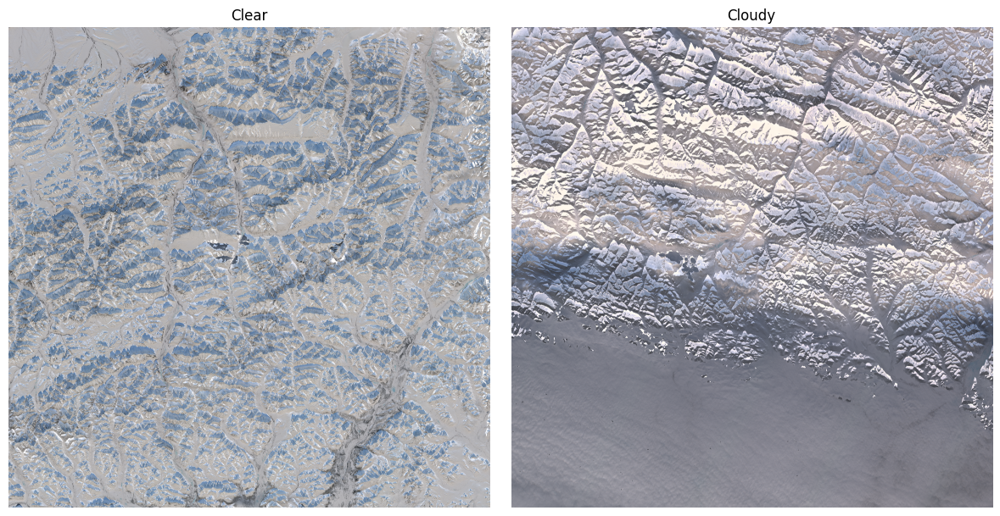

Processing pair 1
Extracted cloudless_data/pair_0001_clear.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_0001_clear
Extracted cloudy_data/pair_0001_cloudy.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_0001_cloudy


In [ ]:
# Visualize the RBG pairs

for i in range(0,5):
    # Print 
    print(f"Processing pair {i}")
    unzip_safe_product(f"cloudless_data/pair_000{i}_clear.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear")
    unzip_safe_product(f"cloudy_data/pair_000{i}_cloudy.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy")
    clear_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_000{i}_clear")
    cloudy_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_000{i}_cloudy")
    plot_rgb_pair(clear_rgb, cloudy_rgb)


Processing pair 4
Extracted cloudless_data/pair_0004_clear.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_0004_clear
Extracted cloudy_data/pair_0004_cloudy.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_0004_cloudy


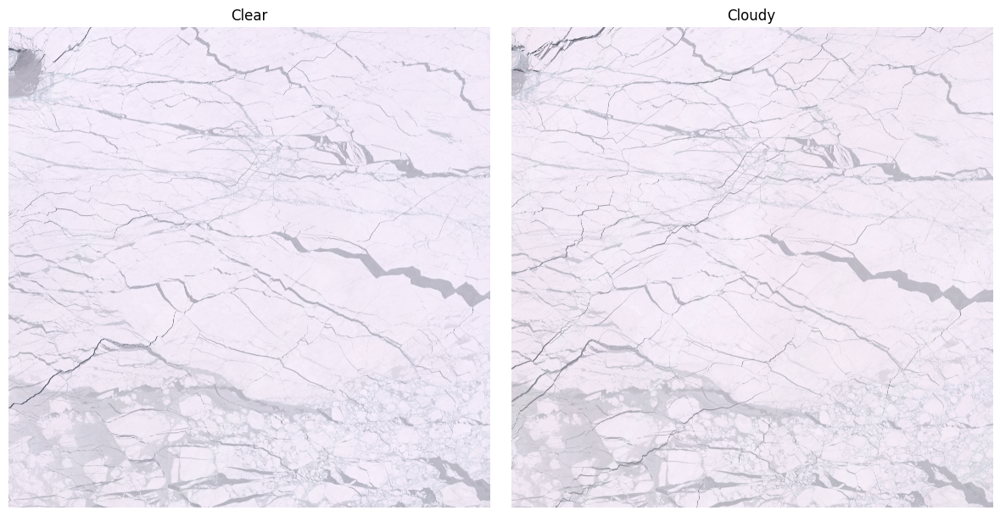

In [17]:
for i in range(4,5):
    print(f"Processing pair {i}")
    unzip_safe_product(f"cloudless_data/pair_000{i}_clear.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear")
    unzip_safe_product(f"cloudy_data/pair_000{i}_cloudy.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy")
    clear_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_000{i}_clear")
    cloudy_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_000{i}_cloudy")
    plot_rgb_pair(clear_rgb, cloudy_rgb)

Processing pair 5
Extracted cloudless_data/pair_0005_clear.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_0005_clear
Extracted cloudy_data/pair_0005_cloudy.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_0005_cloudy


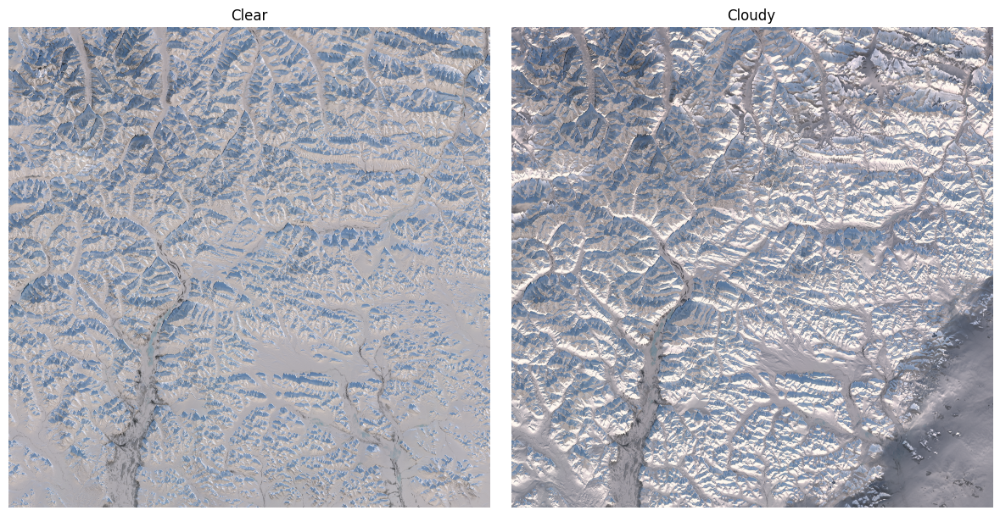

In [ ]:
for i in range(5,6):
    print(f"Processing pair {i}")
    unzip_safe_product(f"cloudless_data/pair_000{i}_clear.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear")
    unzip_safe_product(f"cloudy_data/pair_000{i}_cloudy.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy")
    clear_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_000{i}_clear")
    cloudy_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_000{i}_cloudy")
    plot_rgb_pair(clear_rgb, cloudy_rgb)

Processing pair 8
Extracted cloudless_data/pair_0008_clear.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_0008_clear
Extracted cloudy_data/pair_0008_cloudy.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_0008_cloudy


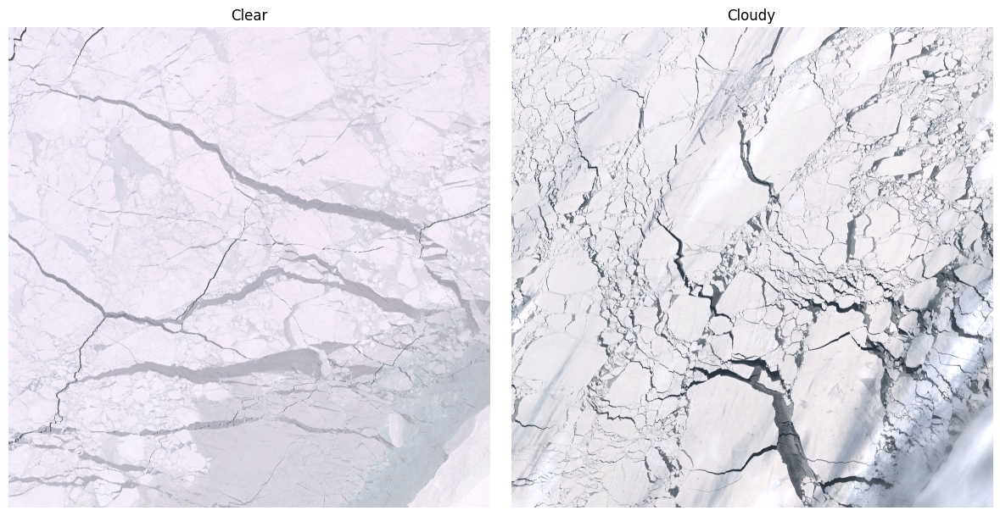

In [23]:
for i in range(8,9):
    print(f"Processing pair {i}")
    unzip_safe_product(f"cloudless_data/pair_000{i}_clear.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear")
    unzip_safe_product(f"cloudy_data/pair_000{i}_cloudy.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy")
    clear_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_000{i}_clear")
    cloudy_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_000{i}_cloudy")
    plot_rgb_pair(clear_rgb, cloudy_rgb)

Processing pair 18
Extracted cloudless_data/pair_0018_clear.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_0018_clear
Extracted cloudy_data/pair_0018_cloudy.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_0018_cloudy


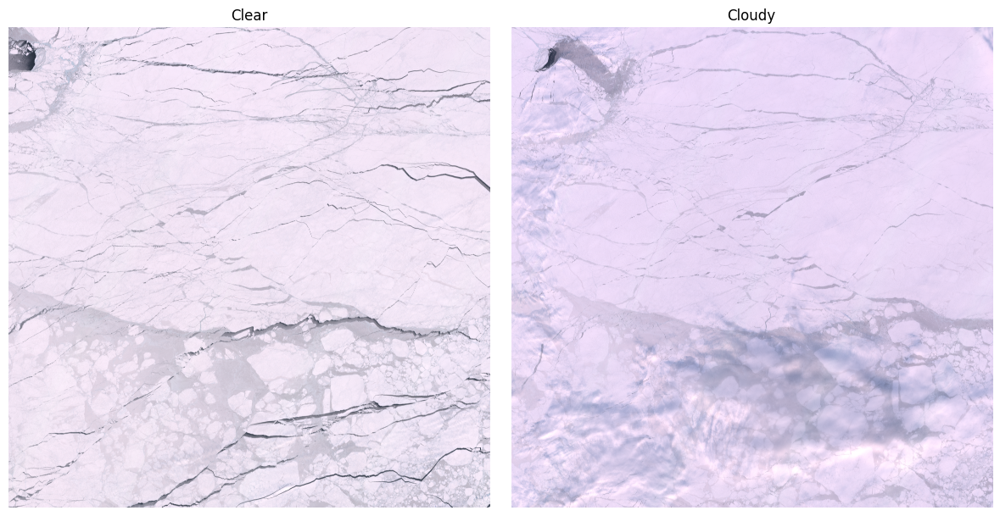

In [43]:
for i in range(18,19):
    print(f"Processing pair {i}")
    unzip_safe_product(f"cloudless_data/pair_00{i}_clear.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear")
    unzip_safe_product(f"cloudy_data/pair_00{i}_cloudy.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy")
    clear_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_00{i}_clear")
    cloudy_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_00{i}_cloudy")
    plot_rgb_pair(clear_rgb, cloudy_rgb)

Processing pair 24
Extracted cloudless_data/pair_0024_clear.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_0024_clear
Extracted cloudy_data/pair_0024_cloudy.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_0024_cloudy


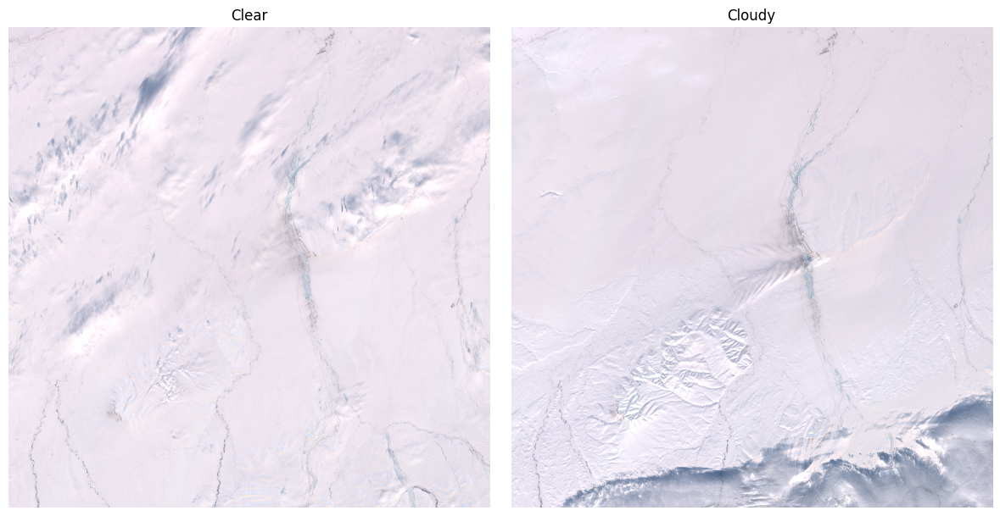

In [ ]:
for i in range(24,25):
    print(f"Processing pair {i}")
    unzip_safe_product(f"cloudless_data/pair_00{i}_clear.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear")
    unzip_safe_product(f"cloudy_data/pair_00{i}_cloudy.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy")
    clear_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_00{i}_clear")
    cloudy_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_00{i}_cloudy")
    plot_rgb_pair(clear_rgb, cloudy_rgb)

Processing pair 25
Extracted cloudless_data/pair_0025_clear.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_0025_clear
Extracted cloudy_data/pair_0025_cloudy.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_0025_cloudy


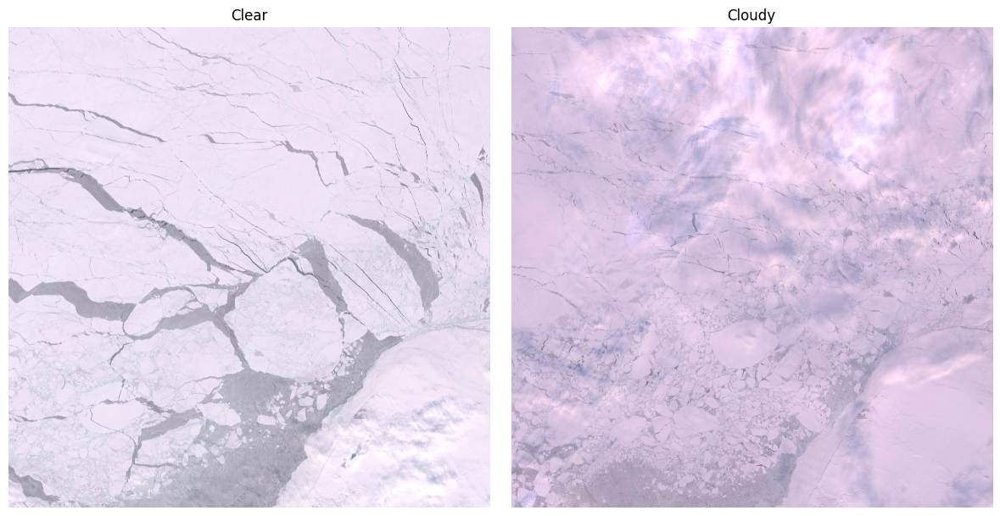

In [51]:
for i in range(25,26):
    print(f"Processing pair {i}")
    unzip_safe_product(f"cloudless_data/pair_00{i}_clear.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear")
    unzip_safe_product(f"cloudy_data/pair_00{i}_cloudy.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy")
    clear_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_00{i}_clear")
    cloudy_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_00{i}_cloudy")
    plot_rgb_pair(clear_rgb, cloudy_rgb)

Processing pair 27
Extracted cloudless_data/pair_0027_clear.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_0027_clear
Extracted cloudy_data/pair_0027_cloudy.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_0027_cloudy


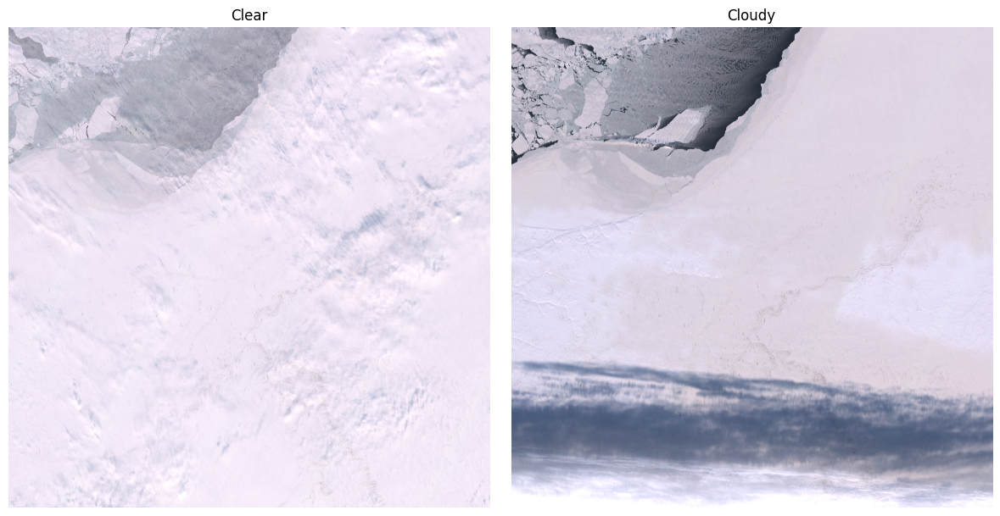

In [53]:
for i in range(27,28):
    print(f"Processing pair {i}")
    unzip_safe_product(f"cloudless_data/pair_00{i}_clear.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear")
    unzip_safe_product(f"cloudy_data/pair_00{i}_cloudy.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy")
    clear_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_00{i}_clear")
    cloudy_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_00{i}_cloudy")
    plot_rgb_pair(clear_rgb, cloudy_rgb)

Processing pair 28
Extracted cloudless_data/pair_0028_clear.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_0028_clear
Extracted cloudy_data/pair_0028_cloudy.zip to /Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_0028_cloudy


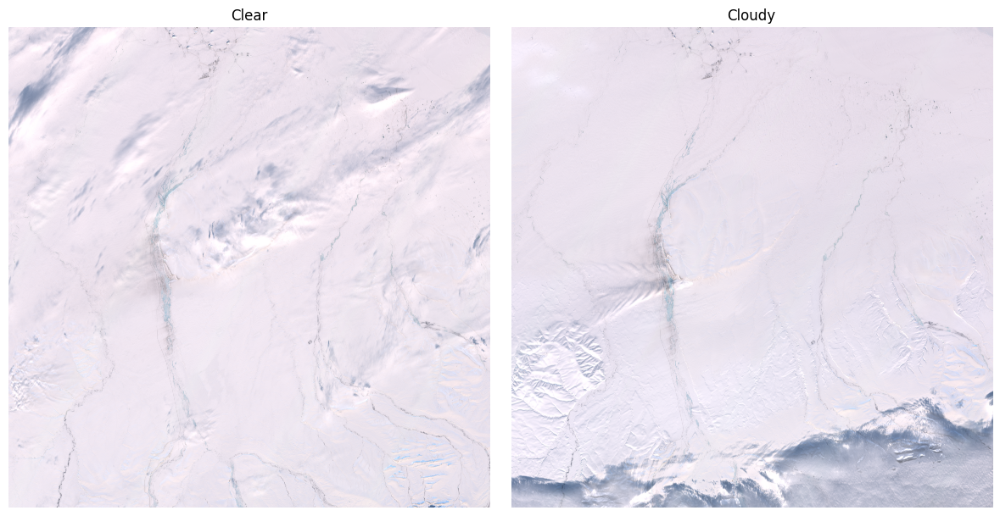

In [54]:
for i in range(28,29):
    print(f"Processing pair {i}")
    unzip_safe_product(f"cloudless_data/pair_00{i}_clear.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear")
    unzip_safe_product(f"cloudy_data/pair_00{i}_cloudy.zip", "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy")
    clear_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_00{i}_clear")
    cloudy_rgb = load_rgb_from_safe(f"/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_00{i}_cloudy")
    plot_rgb_pair(clear_rgb, cloudy_rgb)

In [13]:
def load_scl_band(safe_dir):
    # Find the SCL file inside the SAFE directory
    scl_path = glob.glob(os.path.join(
        safe_dir, "GRANULE", "*", "IMG_DATA", "R20m", "*_SCL_20m.jp2"
    ))[0]  # assumes one SCL file
    
    with rasterio.open(scl_path) as scl_src:
        scl = scl_src.read(1)
        profile = scl_src.profile
    
    return scl, profile

def plot_cloud_mask(scl):
    # SCL values: 0–11, with clouds at 8–10
    cloud_mask = np.isin(scl, [8, 9, 10])  # clouds, cirrus, cloud shadows
    
    plt.figure(figsize=(10, 6))
    plt.imshow(cloud_mask, cmap="gray")
    plt.title("Cloud Mask from SCL Band (white = cloud/cirrus/shadow)")
    plt.axis("off")
    plt.show()

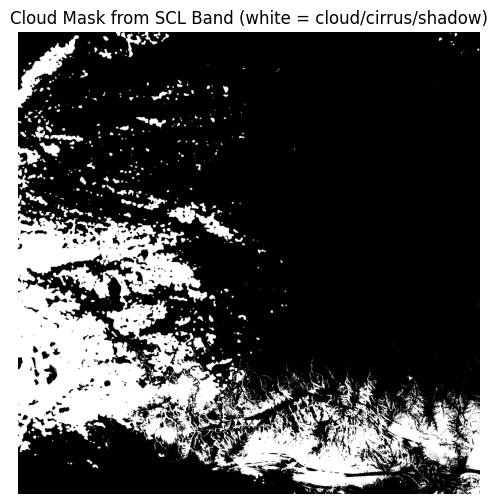

In [47]:
safe_path = "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/cloudy/pair_0021_cloudy/S2A_MSIL2A_20240306T225531_N0510_R001_T03WXT_20240307T003045.SAFE"  # the .SAFE folder
scl_array, scl_profile = load_scl_band(safe_path)
plot_cloud_mask(scl_array)

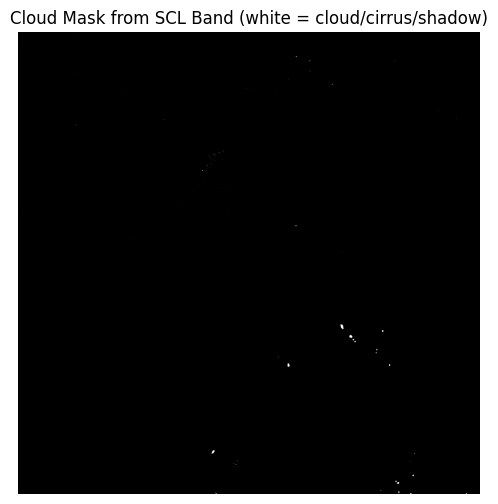

In [24]:
safe_path = "/Users/tessacannon/Documents/UCL/AI4EO/Cloud Removal Project/temp/clear/pair_0000_clear/S2A_MSIL2A_20240312T213531_N0510_R086_T07WDS_20240313T010449.SAFE"  # the .SAFE folder
scl_array, scl_profile = load_scl_band(safe_path)
plot_cloud_mask(scl_array)

In [ ]:
# deleted
# pair 1: significant ice change
# pair 4: no clouds visually detected
# pair 5: large lighting difference
# pair 6: potential misalignment with cloud mask
# pair 8: significant ice change
# pair 9: file corruption
# pair 11: extreme cloud cover
# pair 13: significant ice change
# pair 14: not sure, cloud might not be visible
# pair 16: significant ice change
# pair 17: significant ice change  
# pair 18: ice shift 
# pair 21: undetected clouds in clear image
# pair 22: file corruption
# pair 23: significant ice change
# pair 24: maybe undetected clouds in clear image
# pair 25: significant ice change
# pair 27: undetected clouds in clear image